# Сегментация окурка сигареты на фотографии

## Анализ данных и препроцессинг

Данные представляют из себя искуственно сгенерированные изображения окурков на произвольном фоне, и разделены на три подвыборки размера 2000 в обучающей, 200 в валидационной и 10 в тестовой соотвественно. Все изображения имеют одинаковый размер 512x512 и хранятся в формате .jpg. Дополнительно в каждой папке присутствует файл с аннотациями, содержащий маску для сегментации изображения. На всех изображениях в тренировочной выборке было по одному окурку

#### При первом взгляде на валидационные данные можно сразу заметить несколько изображений, на которых визуально крайне сложно выделить окурки из-за наличия объектов схожей геометрии и цвета

![](../images/35.jpg)

На этапе препроцессинга я извлекаю маски из .json файла и перевожу их в формат черно-белых .jpg - изображений для дальнейшего удобства работы с интерфейсом библиотеки torchvision и dataloader-ами библиотеки PyTorch. 

Весь этап препроцессинга реализован в отдельном скрипте preprocessing.py

In [ ]:
!!python3 preprocessing.py

Для дополнительного увеличения объема обучающей выборки я использовал аугментацию изображений - случайные повороты, обрезки, вертикальные и горизонтальные отражения, которые применялись случайно с вероятностью 0.25 

In [16]:
from matplotlib import pyplot as plt
import numpy as np
import torch

from postprocessing import *
from datasets import CigButtDataset

#from google.colab import drive
#drive.mount('/content/drive', force_remount=True)

DATA_PATH     = 'cig_butts'
val_dataset   = CigButtDataset(os.path.join(DATA_PATH, 'val'))
test_dataset_folder = 'cig_butts/real_test'
val_batch_gen = torch.utils.data.DataLoader(
    val_dataset, batch_size = 20, shuffle=False)


Mounted at /content/drive


### Выбор модели и обучение

В качестве baseline - архитектуры была выбрана UNet-подобная архитектура (https://arxiv.org/pdf/1505.04597.pdf).
Для реализации была использована библиотека глубокого обучения PyTorch. В оригинальной статье размер изображения менялся в ходе forward-pass, но в этой постановке размер маски совпадает с размером изображения, поэтому все сверки в архитектури имели ядро 3x3 и padding 1.

В качестве функции потерь при обучении была выбрана взвешенная бинарная кросс-энтропия. Веса для пикселей в маске изображения для балансировки классов вычислялись на стадии препроцессинга по формуле.

$$w_{\text{пиксель окурка}} = \frac{\text{Общий размер изображения}}{\text{Количество ненулевых пикселов в маске}}$$. 

#####  Интерфейс для обучения модели в Google Collaboratory продемонстрирован в ноутбуке training_demo

Обучить оригинальную архитектуру с малыми модификациями (без изменений количества и размеров слоев) на адекватном размере батча, не получилось в силу нехватки памяти GPU в Google Сollaboraty, а на батче размером 1, предложенном в оригинальной статье, из-за неточной аппроксимации градиента сеть расходилась даже в случая выполнения условий Роббинса-Монро (https://arxiv.org/pdf/1805.08114.pdf) и значения момента алгоритма стох. градиентного спуска в 0.99 

Первым и наиболее естественным желанием по улучшению модели было увеличение размера бачта для лучшей аппроксимации градиента на шаге оптимизатора. Для этого, в силу ограниченности памяти GPU в Google Collaboratory, пришлось в 4 раза, по сравнению с оригинальной сетью, сократить количество фильтров на каждом сверточном слое, за исключением входного и выходного, а также установить stide и kernel_size равным 4 в первых двух maxpool-слоя, при этом аналогично модифицировав upconv-слои во второй 'половине' сети. 

Такой подход позволил обучать модель с помощью оптимизационного алгоритма Adam на батче размера 16. После 60 эпох и 2.5 часов обучения функция потерь вышла на плато c финальным значением метрики на валидационном датасете $\simeq$ 0.839

##### Всюду далее для подсчета метрики используется порогом в 0.95

### Модель №1

![](../images/learning_history_unet3.jpg)

#### Значение целевой метрики

In [17]:
unet3 = torch.load('unet1.pth')
unet3_path = '/content/drive/My Drive/images/unet3_low_metrics'
unet3.train(False)

threshold, dice = get_optimal_dice_threshold(unet3, val_batch_gen)
print(f"Optimal dice value for unet3 on dataset with augmentations - {dice}")
print(f"Optimal threshold - {threshold}")           

Optimal dice value for unet3 on dataset with augmentations - 0.8391181715579087
Optimal threshold - 0.95


#### 'Сложные' для модели изображения (без фильтрации по порогу)

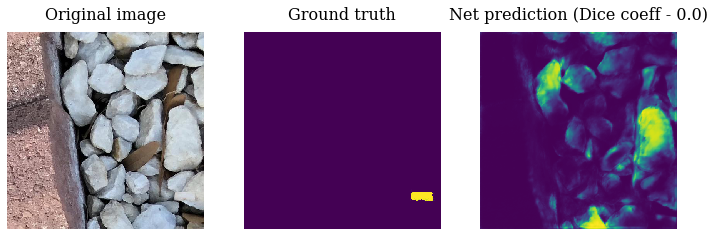

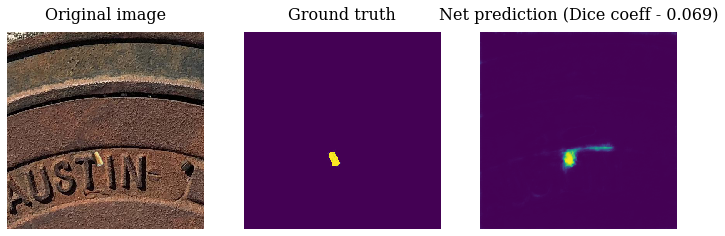

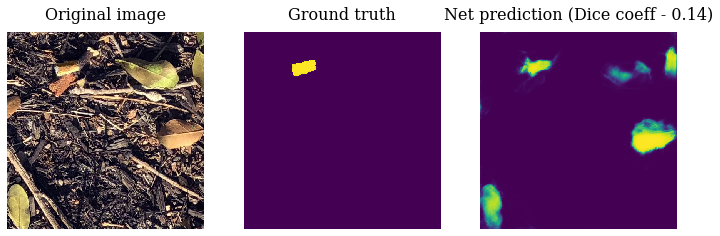

In [18]:
get_samples_with_low_dice_metrics(unet3, val_batch_gen, unet3_path) 

#### Предсказания для тестового датасета (без фильтрации по порогу)

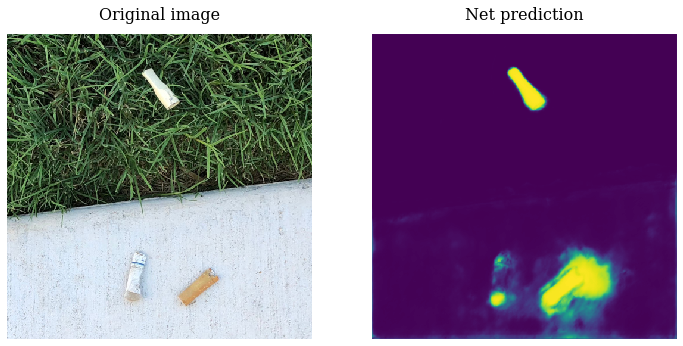

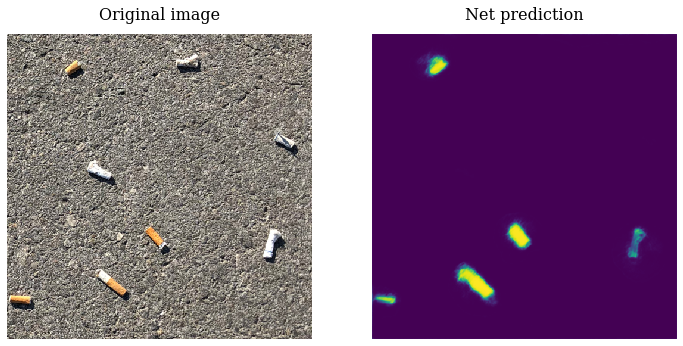

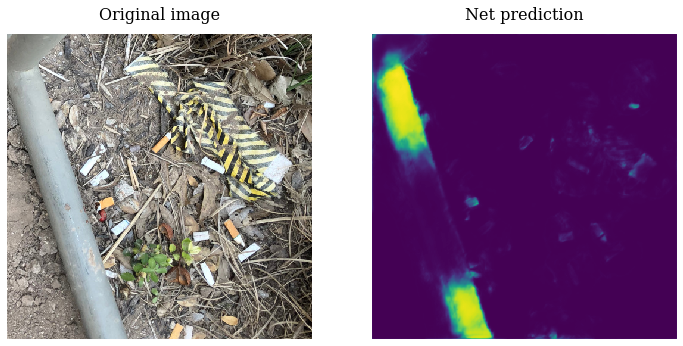

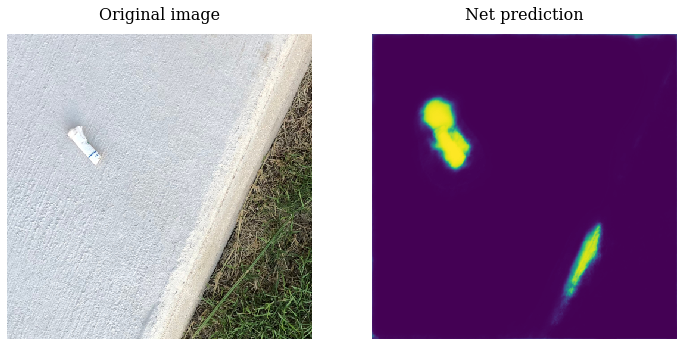

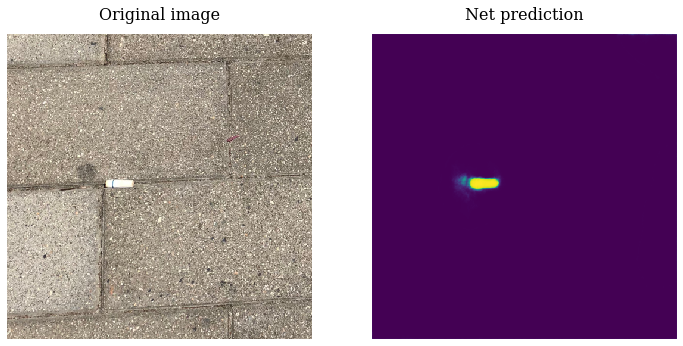

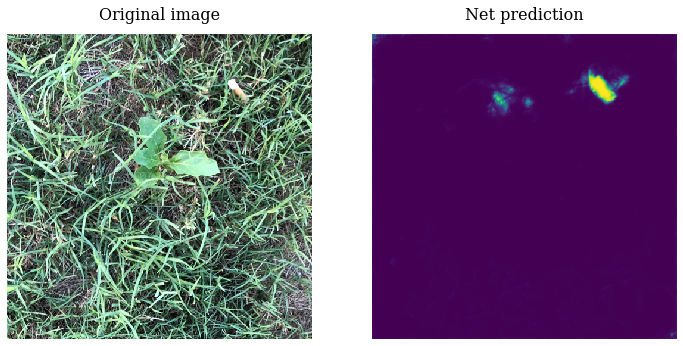

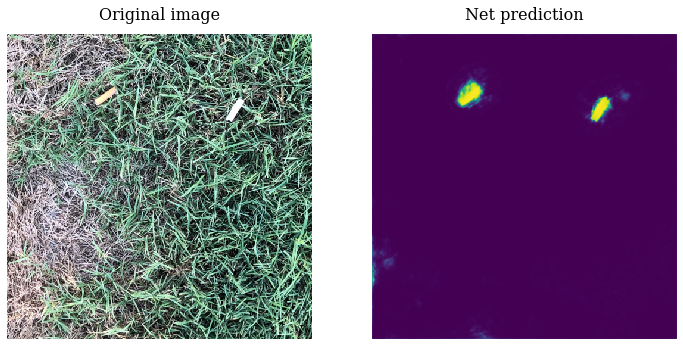

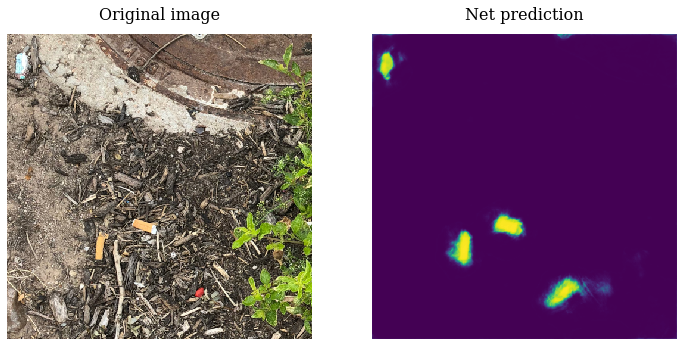

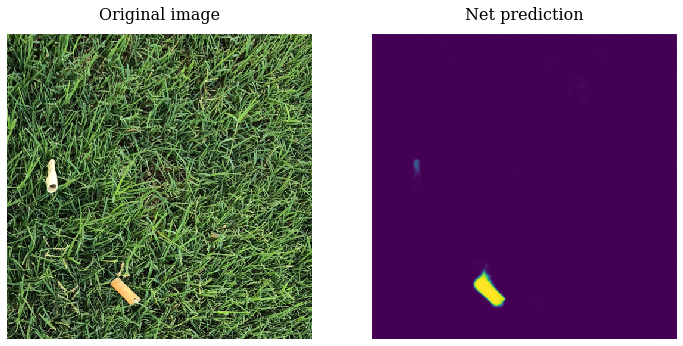

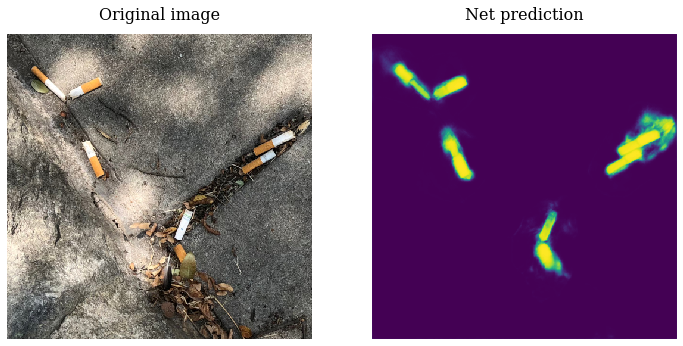

In [19]:
evaluate_model_on_test(unet3, test_dataset_folder)
del unet3
torch.cuda.empty_cache() 

##### Предположение о том, что метрика будет низкой на описанных выше изображениях, подтвердилось.

В попытках сделать модель более робастной, я решил искуственно увеличить датасет приблизительно на 10%, случайно добавляя на изображение из обучающей выборки дополнительный окурок схожего размера, не пересекающийся с исходным, пользуясь другими изображениями из той же выборки (ссылка на увеличенный датасет - https://www.dropbox.com/s/cweqc99ew6wsftv/cig_butts.tar?dl=0) 

##### Пример искуственно добавленного  дополнительного окурка

![](../images/sig_butt_artificial.jpg)

Вопреки ожиданиям, метрика на валидации упала до $\simeq$ 0.816, и результат на тестовом датасете не стал значительно лучше

### Модель №2

![](../images/learning_history_unet3_extended.jpg)


#### Значение целевой метрики

In [22]:
unet3_extended = torch.load('unet_extended.pth')
unet3_extended_path = '/content/drive/My Drive/images/unet3_extended_low_metrics'
unet3_extended.train(False)

threshold, dice = get_optimal_dice_threshold(unet3_extended, val_batch_gen)
print(f"Optimal dice value for unet3 on extended dataset with augmentations - {dice}")
 

Optimal dice value for unet3 on extended dataset with augmentations - 0.8157992729769529


#### 'Сложные' для модели изображения (без фильтрации по порогу)

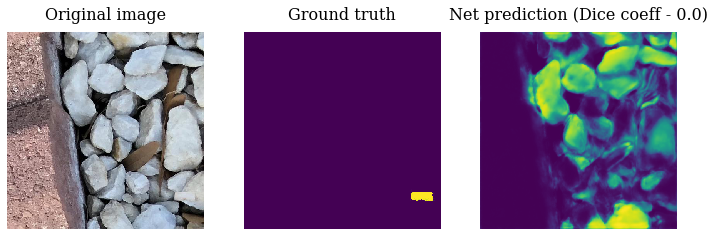

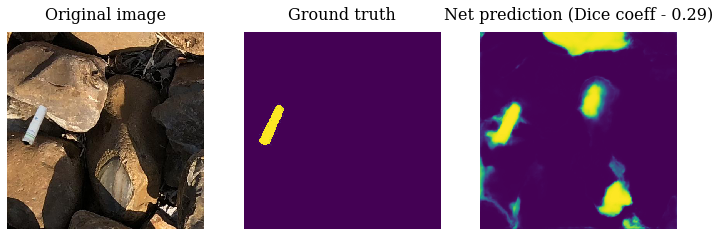

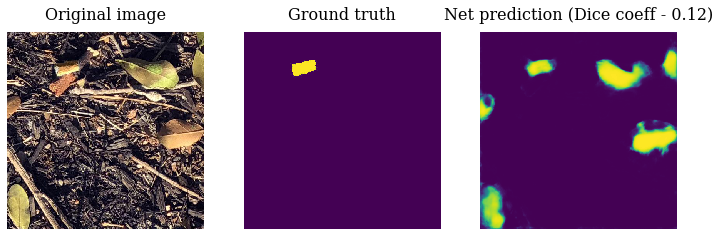

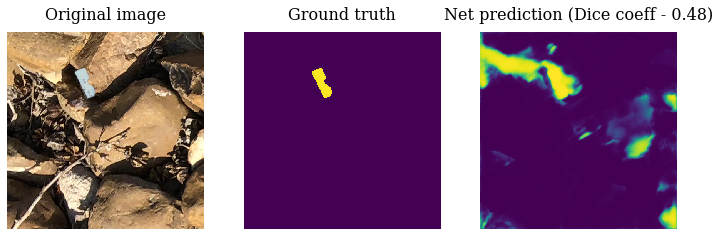

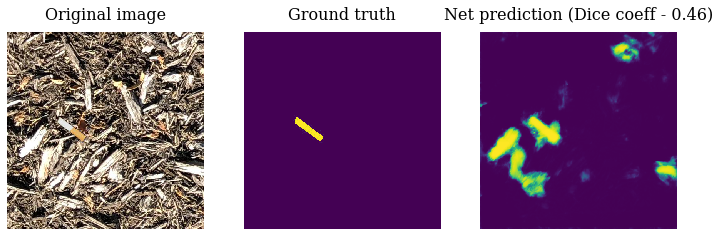

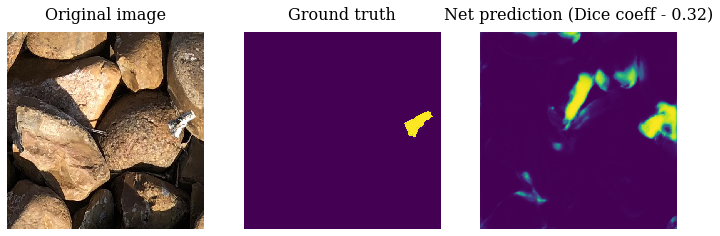

In [23]:
get_samples_with_low_dice_metrics(unet3_extended, val_batch_gen, unet3_extended_path)  

#### Предсказания для тестового датасета (без фильтрации по порогу)

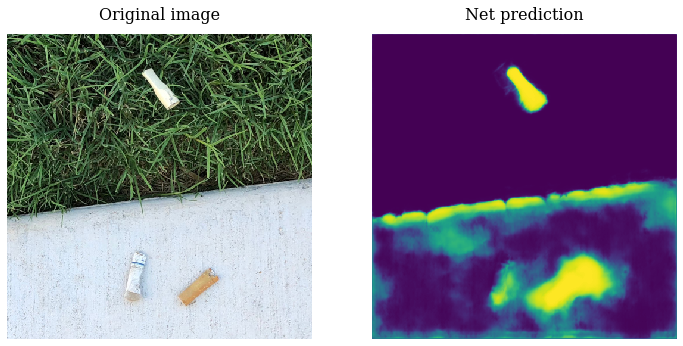

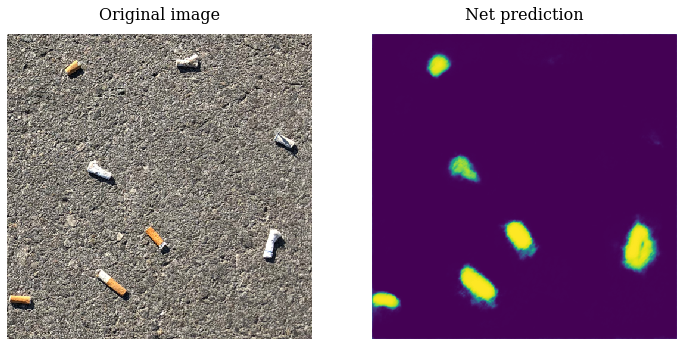

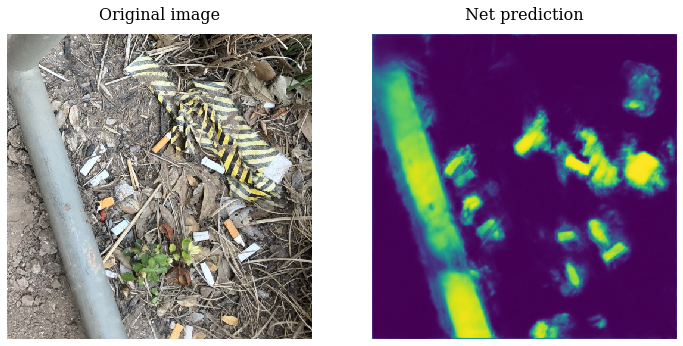

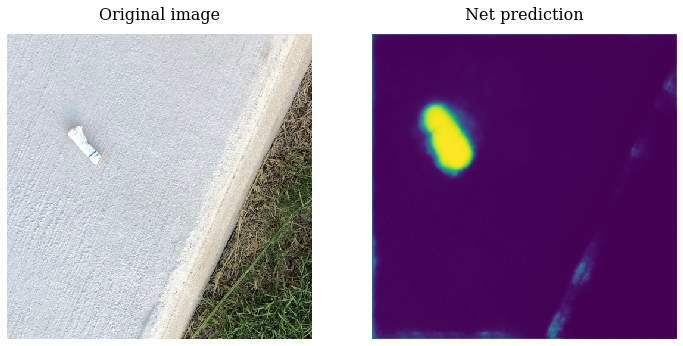

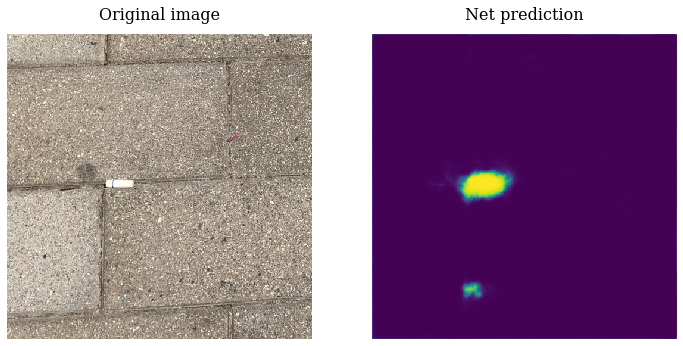

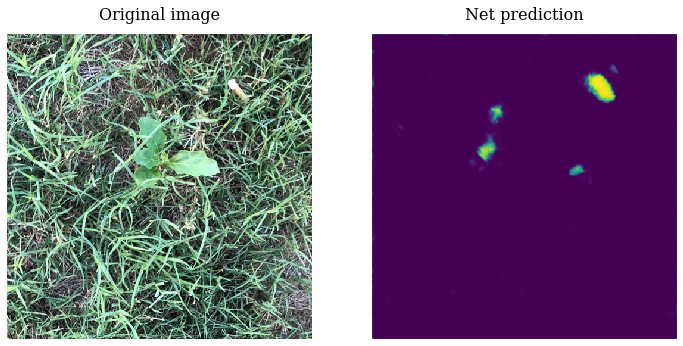

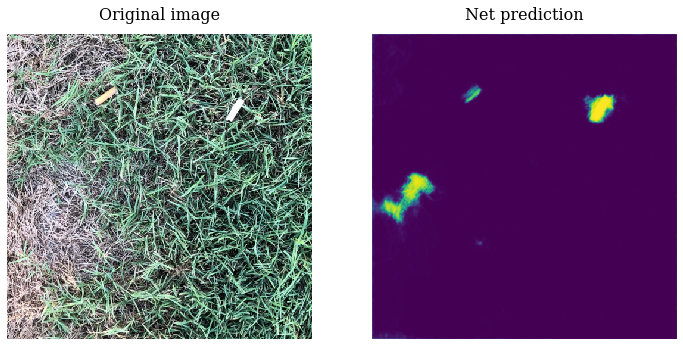

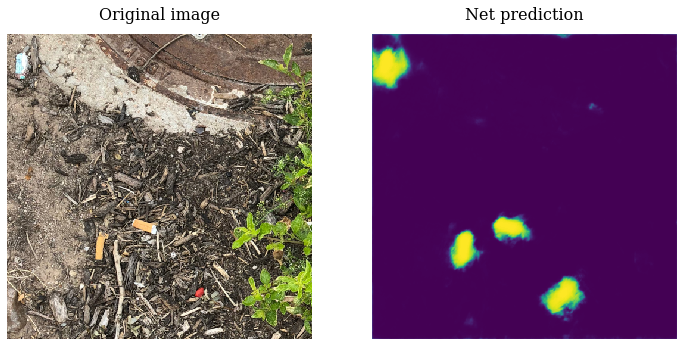

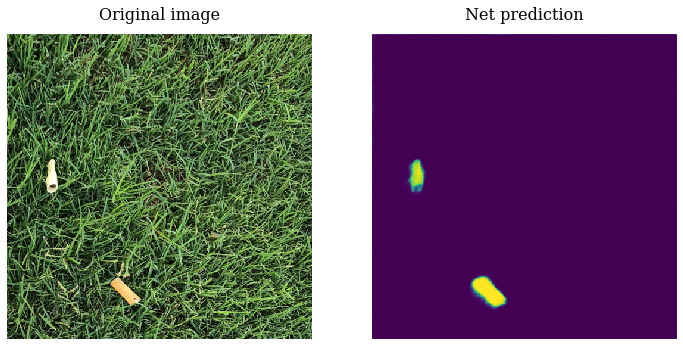

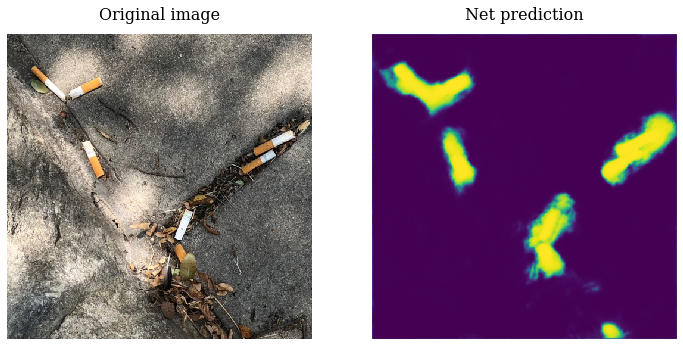

In [24]:
evaluate_model_on_test(unet3_extended, test_dataset_folder)
del unet3_extended
torch.cuda.empty_cache() 

Для улучшения качества прогнозов я несколько уменьшил вес модели, заменив upconv-слои
транспонированными свертками, и уменьшил число фильтров в начале сети

Новая модель получила значение метрики $\simeq$ 0.825, но качество прогнозов на тестовом датасете выросло

### Модель №3
![](../images/learning_history_unet4_extended.jpg)
#### Значение целевой метрики

In [25]:
unet4_extended = torch.load('unet_transposed.pth')
unet4_extended.train(False)
unet4_extended = '/content/drive/My Drive/images/unet4_extended'

threshold, dice = get_optimal_dice_threshold(unet4_extended, val_batch_gen)
print(f"Optimal dice value for unet on extended dataset with transposed convs and augmentations - {dice}")

Optimal dice value for unet on extended dataset with transposed convs and augmentations - 0.8255526371856113


#### 'Сложные' для модели изображения (без фильтрации по порогу)

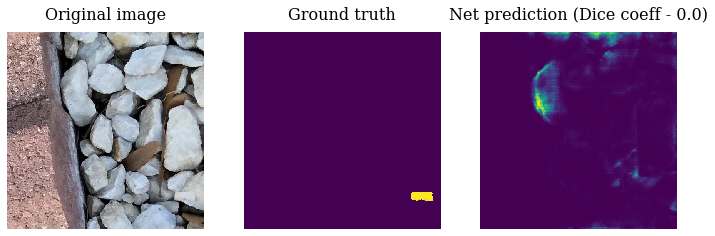

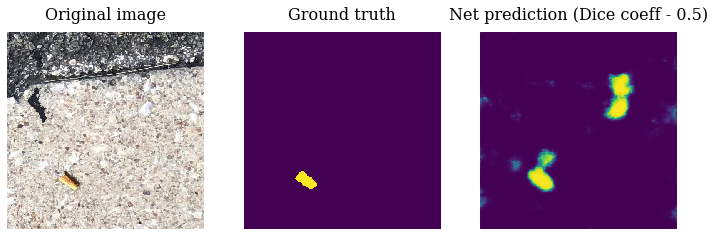

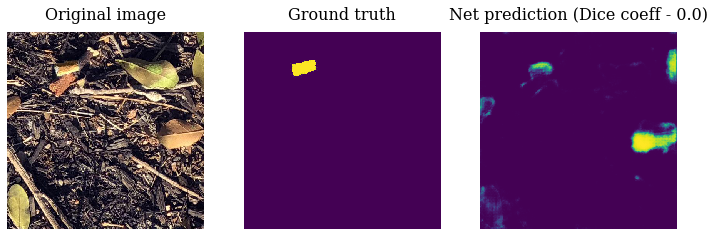

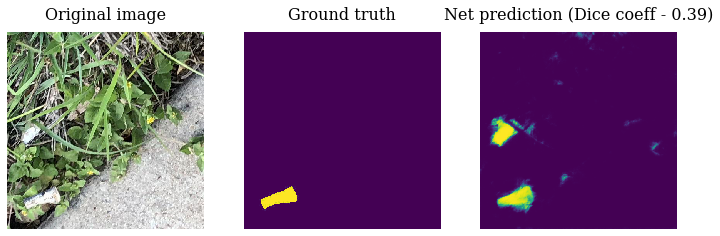

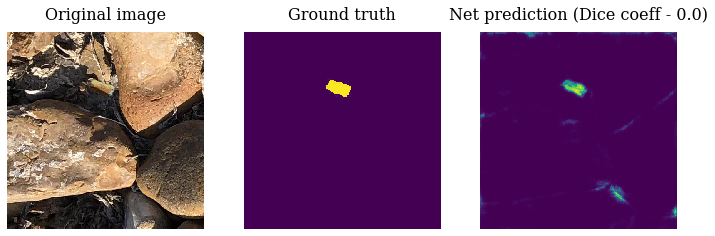

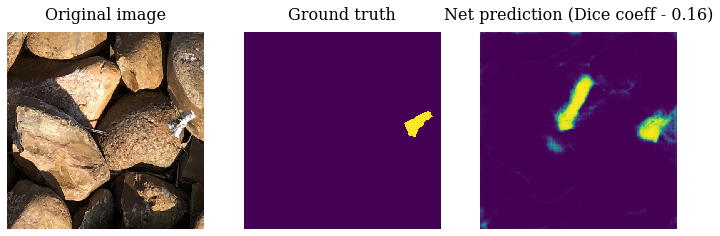

In [26]:
get_samples_with_low_dice_metrics(unet4_extended, val_batch_gen, unet4_path)

#### Предсказания для тестового датасета (без фильтрации по порогу)

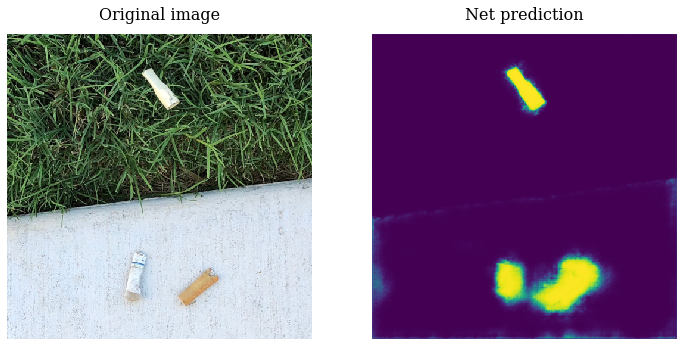

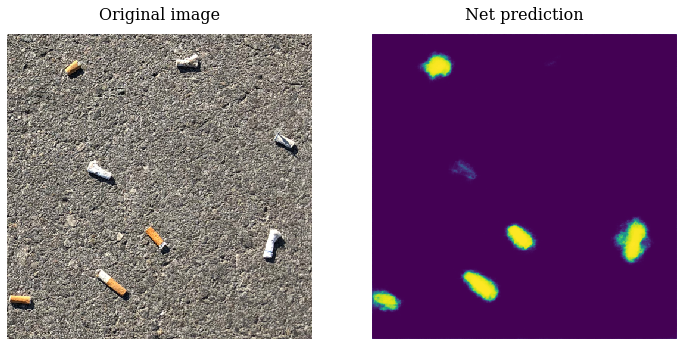

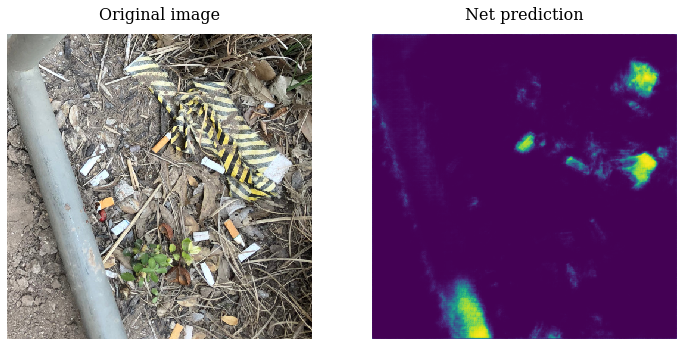

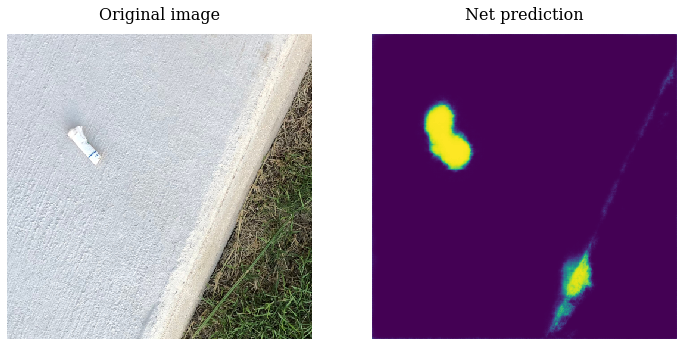

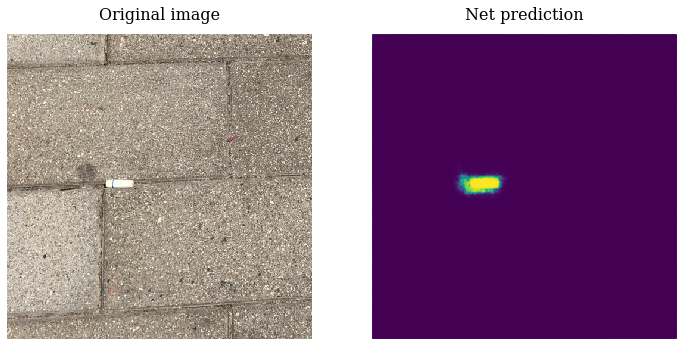

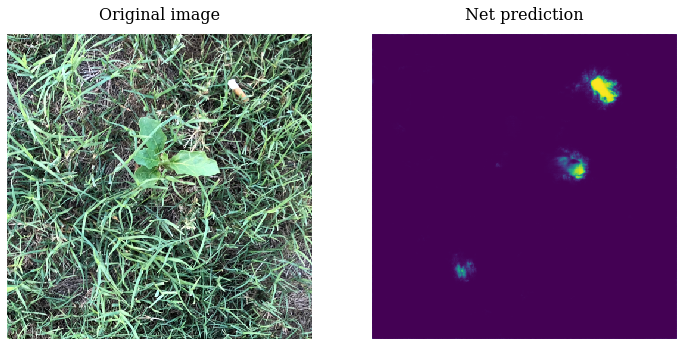

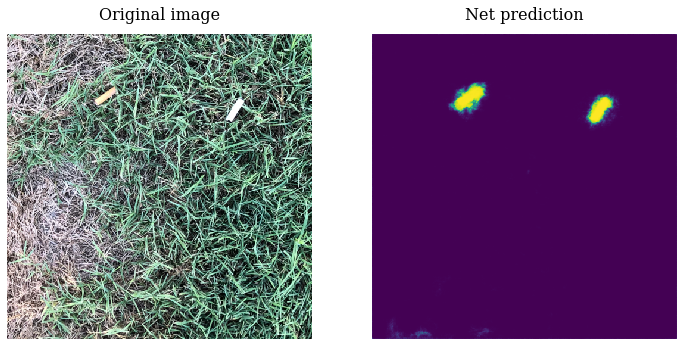

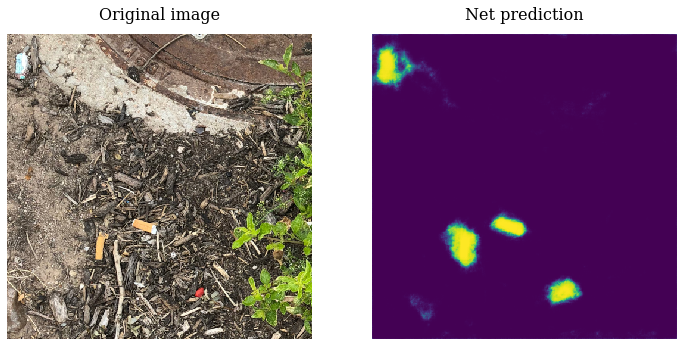

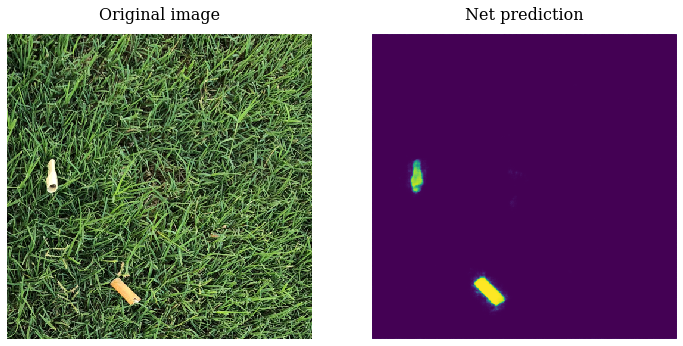

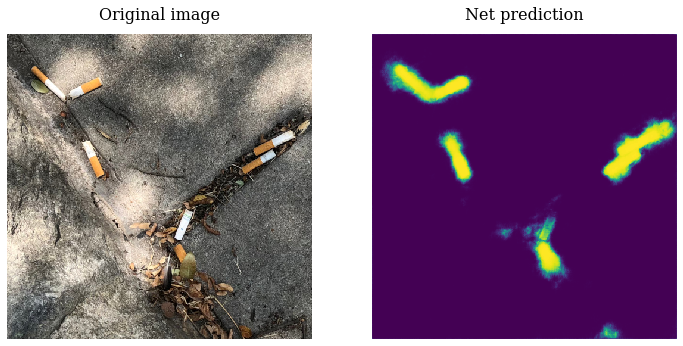

In [27]:
evaluate_model_on_test(unet3_extended_t, test_dataset_folder)
del unet3_extended_t
torch.cuda.empty_cache() 

Видно, что в целом, все модели приблизительно угадывают местоположение окурков, но с геометрией и числом окурков в определенных случаях возникают проблемы. Для дальнейшего повышения точности моделей возможно добавление других агументаций, например, засветки или добавления случайных шумов, а также расширение подхода с комбинированием окурков с разных изображений. Еще один из возможных способов улучшения качества - обучение полной модели из базовой статьи в несколько этапов по слоям, на большом батче

### Запишем маски, полученные с помощью модели с лучшей метрикой на валидации,  в .csv  файл

In [ ]:
unet3 = torch.load('unet1.pth')
unet3_path = '/content/drive/My Drive/images/unet3_low_metrics'
unet3.train(False)

from lib.utils import decode_rle
from lib.show import show_img_with_mask
import pandas as pd

size = len(val_batch_gen.dataset)
counter = 0
masks = dict()

for batch in val_batch_gen:
    batch_img = batch['image'  ].to(device)
    batch_msk = batch['mask'   ].data.numpy()
    batch_preds = unet3.forward(batch_img).cpu().data.numpy() > 0.95
    for i, mask in enumerate(batch_preds):
        rle_mask = encode_rle(mask.reshape(512, 512))
    masks[counter] = rle_mask
    counter += 1
    
frame = pd.read_csv('pred_val_template.csv')
for i in masks:
    frame['rle_mask'][i] = masks[i]

frame.to_csv('pred_val_template.csv', sep=',')

### И, наконец, сохраним предсказания для тестового датасета в требуемом формате

In [ ]:
from lib.html import get_html
from PIL import Image
from torchvision.transforms import ToTensor

image_to_tensor = ToTensor()

test_dataset_dir = 'cig_butts/real_test'

dir_content = [file for file in os.listdir(test_dataset_dir)]
paths_to_images = []
predictions = []
for image in sorted(dir_content, key=lambda x: x.split(".")):
    img_path = os.path.join(test_dataset_dir, image)
    paths_to_images.append(img_path)
    img      = image_to_tensor(Image.open(img_path).convert('RGB'))
    img      = torch.unsqueeze(img, 0).to(device)
    predictions.append(
        unet3.forward(img).cpu().view(512, 512).data.numpy() > 0.95)
    
get_html(paths_to_images, predictions, path_to_save='/content/drive/My Drive/results/')